# Short Introduction

The objective of this analysis is to extract a specific transport network from OpenStreetMap using the `osmnx` library and perform betweenness centrality analysis on both nodes and edges. Two approaches are demonstrated: one combines both visualizations in a single static plot, while the other displays interactive maps of node and edge centrality results separately. 

The implemented functions are flexible and can be customized for enhanced visual presentation, different weighting schemes, or alternative OSM feature filters. Toward the end of the notebook, an example demonstrates how to generalize the functions using a custom OSM filter, allowing the analysis to be applied to a variety of transport networks.

# Importing Libraries

In [31]:
import networkx as nx 
import osmnx as ox 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Betweenness Centrality Analysis

### Combined Betweennes Centrality Analysis

In [32]:
def betweeness_centrality(location_point, distance, network_type, tolerance):
    """
    Calculate and visualize node and edge betweenness centrality in a street network.

    Parameters:
    - location_point: tuple (latitude, longitude) specifying the center point for the graph
    - distance: distance in meters for the graph from the center point
    - network_type: type of street network to download (e.g., 'walk', 'drive')
    - tolerance: tolerance (in meters) for consolidating intersections
    """

    # Download street network from OpenStreetMap within a distance around a point
    G = ox.graph.graph_from_point(location_point, dist=distance, dist_type="bbox", network_type=network_type)

    # Project the graph to UTM (for accurate spatial analysis)
    G_proj = ox.projection.project_graph(G)

    # Simplify intersections (e.g., turning many nodes at one intersection into one node)
    G2 = ox.simplification.consolidate_intersections(
        G_proj, rebuild_graph=True, tolerance=tolerance, dead_ends=False
    )

    # Compute **node** betweenness centrality using path lengths as weights
    bc = nx.betweenness_centrality(
        ox.convert.to_digraph(G2), weight="length", normalized=True
    )
    # Add centrality values as node attributes
    nx.set_node_attributes(G2, bc, "bc")

    # Get node colors based on betweenness centrality for visualization
    nc = ox.plot.get_node_colors_by_attr(G2, "bc", cmap="plasma")

    # Compute **edge** betweenness centrality
    edge_betweenness = nx.edge_betweenness_centrality(G2, normalized=True)
    # Add centrality values as edge attributes
    nx.set_edge_attributes(G2, edge_betweenness, "ebc")

    # Get edge colors based on edge betweenness centrality for visualization
    ec = ox.plot.get_edge_colors_by_attr(G2, "ebc", cmap="plasma")

    # Create a side-by-side plot: one for nodes, one for edges
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 9))

    # Plot node betweenness centrality
    ox.plot.plot_graph(
        G2,
        ax=ax1,
        node_color=nc,
        node_size=30,
        node_zorder=2,
        edge_linewidth=0.2,
        edge_color="black",
        show=False,
        close=False
    )
    ax1.set_title("Node Betweenness Centrality")

    # Plot edge betweenness centrality
    ox.plot.plot_graph(
        G2,
        ax=ax2,
        node_color="white",  # Hide nodes
        node_size=0,
        edge_color=ec,
        edge_linewidth=1.5,
        show=False,
        close=False
    )
    ax2.set_title("Edge Betweenness Centrality")

    # Add colorbars to represent centrality values
    sm1 = plt.cm.ScalarMappable(
        cmap="plasma", norm=plt.Normalize(vmin=min(bc.values()), vmax=max(bc.values()))
    )
    sm1._A = []
    fig.colorbar(sm1, ax=ax1, fraction=0.046, pad=0.01, label="Betweenness Centrality (nodes)")

    sm2 = plt.cm.ScalarMappable(
        cmap="plasma", norm=plt.Normalize(vmin=min(edge_betweenness.values()), vmax=max(edge_betweenness.values()))
    )
    sm2._A = []
    fig.colorbar(sm2, ax=ax2, fraction=0.046, pad=0.01, label="Betweenness Centrality (edges)")

    # Show plots neatly
    plt.tight_layout()
    plt.show()

In [33]:
# Copenhagen Example
location_point = (55.70495, 12.58244)
distance = 1500
network_type = "bike"
tolerance = 15

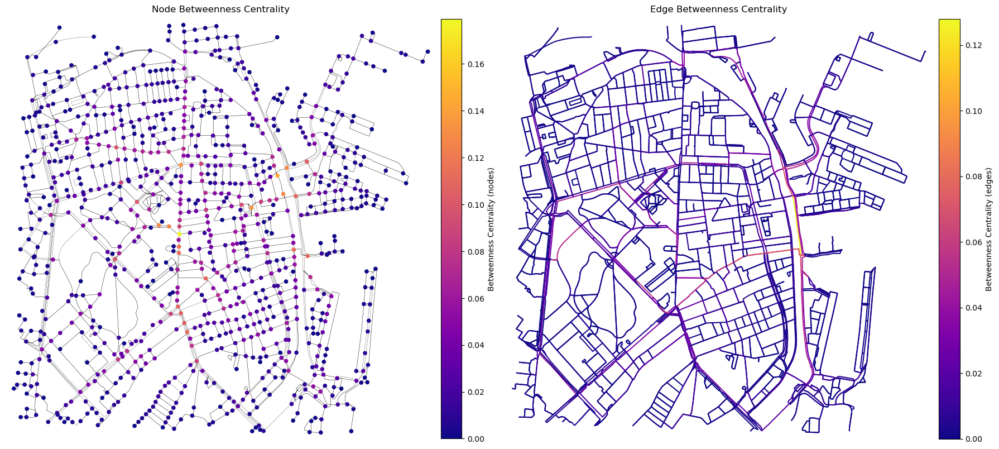

In [34]:
betweeness_centrality(location_point, distance, network_type, tolerance)

### Betweennes Centrality Analysis Using Interactive Maps

In [35]:
def node_betweenness_centrality(location_point, distance, network_type, tolerance):
    """
    Calculate and visualize node betweenness centrality on an interactive map using folium.

    Parameters:
    - location_point: tuple (latitude, longitude) specifying the center point for the graph
    - distance: distance in meters around the center point to define the graph area
    - network_type: type of street network to download (e.g., 'walk', 'drive')
    - tolerance: distance (in meters) for consolidating intersections into single nodes

    Returns:
    - m: a folium map object visualizing the graph with nodes colored by betweenness centrality
    """

    # Download a street network graph from OpenStreetMap within a bounding box around a point
    G = ox.graph.graph_from_point(location_point, dist=distance, dist_type="bbox", network_type=network_type)

    # Project the graph to a UTM coordinate reference system (for accurate spatial analysis)
    G_proj = ox.projection.project_graph(G)

    # Consolidate closely spaced intersections into single nodes
    G2 = ox.simplification.consolidate_intersections(
        G_proj, rebuild_graph=True, tolerance=tolerance, dead_ends=False
    )

    # Convert the simplified graph into GeoDataFrames for nodes and edges
    nodes_gdf, edges_gdf = ox.convert.graph_to_gdfs(G2)

    # Compute node betweenness centrality using path lengths as weights
    bc = nx.betweenness_centrality(
        ox.convert.to_digraph(G2), weight="length"
    )

    # Set betweenness centrality values as node attributes in the graph
    nx.set_node_attributes(G2, bc, "bc")

    # Add centrality values to the nodes GeoDataFrame
    nodes_gdf["bc"] = nodes_gdf.index.map(bc)

    # Create a folium map with edges shown in light blue
    m = edges_gdf.explore(color="skyblue")

    # Overlay nodes on the map, color-coded by betweenness centrality using the plasma colormap
    nodes_gdf.explore(
        m=m,
        column="bc",
        cmap="plasma",
        marker_kwds={"radius": 7},
        legend=True
    )

    # Return the folium map object for display or saving
    return m

In [36]:
node_betweenness_centrality(location_point, distance, network_type, tolerance)

![Interactive Map Screenshot](https://github.com/nikolabarac/betweenness-centrality-analysis/blob/master/nodes_bc_interactive.PNG)

In [37]:
def edge_betweenness_centrality(location_point, distance, network_type, tolerance):
    """
    Calculate and visualize edge betweenness centrality on an interactive map using folium.

    Parameters:
    - location_point: tuple (latitude, longitude) specifying the center point for the graph
    - distance: distance in meters around the center point to define the graph area
    - network_type: type of street network to download (e.g., 'walk', 'drive')
    - tolerance: distance (in meters) for consolidating intersections into single nodes

    Returns:
    - map: a folium map object visualizing the graph with edges color-coded by betweenness centrality
    """

    # Download a street network graph from OpenStreetMap within a bounding box around the given point
    G = ox.graph.graph_from_point(location_point, dist=distance, dist_type="bbox", network_type=network_type)

    # Project the graph to a UTM coordinate system for accurate spatial measurements
    G_proj = ox.projection.project_graph(G)

    # Simplify the graph by consolidating nearby intersections into single nodes
    G2 = ox.simplification.consolidate_intersections(
        G_proj, rebuild_graph=True, tolerance=tolerance, dead_ends=False
    )

    # Convert the simplified graph to GeoDataFrames for nodes and edges
    nodes_gdf, edges_gdf = ox.convert.graph_to_gdfs(G2)

    # Compute edge betweenness centrality (normalized)
    edge_betweenness = nx.edge_betweenness_centrality(G2, normalized=True)

    # Add edge betweenness centrality values to the graph as edge attributes
    nx.set_edge_attributes(G2, edge_betweenness, "ebc")

    # Map the edge centrality values to the edges GeoDataFrame
    edges_gdf["ebc"] = edges_gdf.index.map(edge_betweenness)

    # Visualize the edges on a folium map, colored by their betweenness centrality values
    map = edges_gdf.explore(
        tiles="cartodbpositron",  # Use a light basemap
        column="ebc",             # Color by 'ebc' column
        cmap="plasma",            # Use 'plasma' color map
        legend=True               # Add a legend to the map
    )

    # Return the folium map object
    return map

In [38]:
edge_betweenness_centrality(location_point, distance, network_type, tolerance)

![Interactive Map Screenshot](edges_bc_interactive.png)

### Example with Custom Filter

In [39]:
def betweenness_centrality_custom_filter(location_point, distance, custom_filter, tolerance):
    """
    Calculate and visualize node and edge betweenness centrality for a custom-filtered OSM network.

    Parameters:
    - location_point: tuple (latitude, longitude) specifying the center point for the network
    - distance: distance in meters for the network radius from the center point
    - custom_filter: Overpass API custom filter string to specify the network type (e.g., '["highway"]', '["railway"]')
    - tolerance: tolerance (in meters) for consolidating nearby intersections
    """

    # Download a network from OpenStreetMap using the custom filter
    G = ox.graph.graph_from_point(
        location_point,
        dist=distance,
        dist_type="bbox",
        custom_filter=custom_filter
    )

    # Project the graph to a UTM coordinate system for spatial accuracy
    G_proj = ox.projection.project_graph(G)

    # Consolidate intersections (merge nearby nodes based on spatial tolerance)
    G2 = ox.simplification.consolidate_intersections(
        G_proj, rebuild_graph=True, tolerance=tolerance, dead_ends=False
    )

    # Compute node betweenness centrality with edge lengths as weights
    bc = nx.betweenness_centrality(
        ox.convert.to_digraph(G2), weight="length", normalized=True
    )
    nx.set_node_attributes(G2, bc, "bc")  # Attach centrality to nodes

    # Node color mapping based on centrality values
    nc = ox.plot.get_node_colors_by_attr(G2, "bc", cmap="plasma")

    # Compute edge betweenness centrality
    edge_betweenness = nx.edge_betweenness_centrality(G2, normalized=True)
    nx.set_edge_attributes(G2, edge_betweenness, "ebc")  # Attach centrality to edges

    # Edge color mapping based on centrality values
    ec = ox.plot.get_edge_colors_by_attr(G2, "ebc", cmap="plasma")

    # Create side-by-side plots for node and edge centrality
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 9))

    # Plot node centrality
    ox.plot.plot_graph(
        G2,
        ax=ax1,
        node_color=nc,
        node_size=30,
        node_zorder=2,
        edge_linewidth=0.2,
        edge_color="black",
        show=False,
        close=False
    )
    ax1.set_title("Node Betweenness Centrality")

    # Plot edge centrality
    ox.plot.plot_graph(
        G2,
        ax=ax2,
        node_color="white",
        node_size=0,
        edge_color=ec,
        edge_linewidth=1.5,
        show=False,
        close=False
    )
    ax2.set_title("Edge Betweenness Centrality")

    # Add colorbars for visual reference
    sm1 = plt.cm.ScalarMappable(
        cmap="plasma", norm=plt.Normalize(vmin=min(bc.values()), vmax=max(bc.values()))
    )
    sm1._A = []
    fig.colorbar(sm1, ax=ax1, fraction=0.046, pad=0.01, label="Betweenness Centrality (nodes)")

    sm2 = plt.cm.ScalarMappable(
        cmap="plasma", norm=plt.Normalize(vmin=min(edge_betweenness.values()), vmax=max(edge_betweenness.values()))
    )
    sm2._A = []
    fig.colorbar(sm2, ax=ax2, fraction=0.046, pad=0.01, label="Betweenness Centrality (edges)")

    # Final layout and display
    plt.tight_layout()
    plt.show()

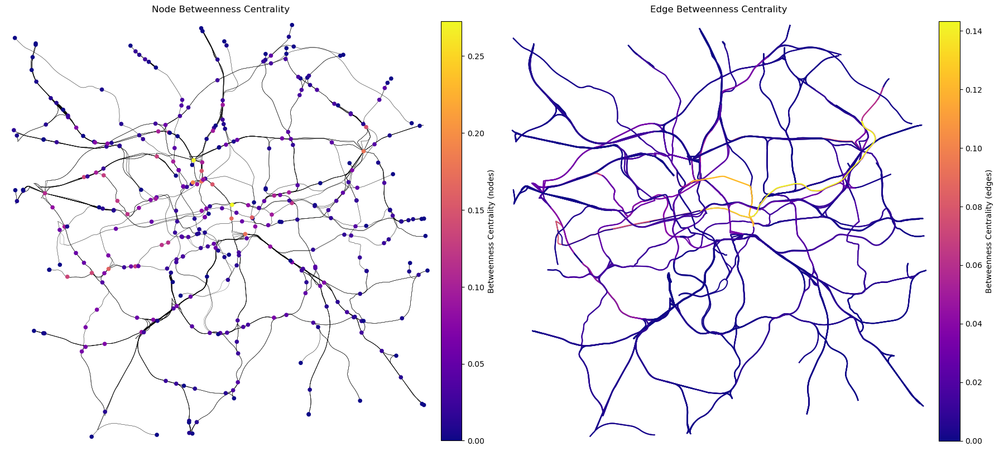

In [40]:
betweenness_centrality_custom_filter((51.50952, -0.11016), 10000, '["railway"~"."]', 100)

In [41]:
def node_betweenness_centrality_custom_filter(location_point, distance, custom_filter, tolerance):
    """
    Calculate and visualize node betweenness centrality on an interactive map using folium
    for a custom-filtered OpenStreetMap network.

    Parameters:
    - location_point: tuple (latitude, longitude) specifying the center point for the graph
    - distance: distance in meters around the center point to define the graph area
    - custom_filter: string with Overpass filter query to specify which types of OSM features to include
    - tolerance: distance (in meters) for consolidating nearby intersections into single nodes

    Returns:
    - m: a folium map object visualizing the graph with nodes colored by betweenness centrality
    """

    # Download network data from OpenStreetMap using the provided custom filter
    G = ox.graph.graph_from_point(
        location_point,
        dist=distance,
        dist_type="bbox",
        custom_filter=custom_filter
    )

    # Project the graph to UTM coordinates for accurate spatial analysis
    G_proj = ox.projection.project_graph(G)

    # Merge nearby nodes representing the same logical intersection
    G2 = ox.simplification.consolidate_intersections(
        G_proj, rebuild_graph=True, tolerance=tolerance, dead_ends=False
    )

    # Convert the simplified graph into GeoDataFrames for nodes and edges
    nodes_gdf, edges_gdf = ox.convert.graph_to_gdfs(G2)

    # Compute node betweenness centrality using edge length as the weight
    bc = nx.betweenness_centrality(
        ox.convert.to_digraph(G2), weight="length"
    )

    # Add betweenness centrality scores as attributes to the graph's nodes
    nx.set_node_attributes(G2, bc, "bc")

    # Attach centrality values to the GeoDataFrame for visualization
    nodes_gdf["bc"] = nodes_gdf.index.map(bc)

    # Create a folium map showing edges in a neutral color
    m = edges_gdf.explore(color="skyblue")

    # Overlay nodes, color-coded by betweenness centrality
    nodes_gdf.explore(
        m=m,
        column="bc",
        cmap="plasma",
        marker_kwds={"radius": 7},
        legend=True
    )

    # Return the interactive map object
    return m

In [42]:
node_betweenness_centrality_custom_filter((51.50952, -0.11016), 10000, '["railway"~"."]', 100)

![Interactive Map Screenshot](custom_filter_nodes_interactive.png)

In [43]:
def edge_betweenness_centrality_custom_filter(location_point, distance, custom_filter, tolerance):
    """
    Calculate and visualize edge betweenness centrality on an interactive map using folium
    for a custom-filtered OpenStreetMap network.

    Parameters:
    - location_point: tuple (latitude, longitude) specifying the center point for the graph
    - distance: distance in meters around the center point to define the graph area
    - custom_filter: string with Overpass filter query to specify which types of OSM features to include
    - tolerance: distance (in meters) for consolidating nearby intersections into single nodes

    Returns:
    - m: a folium map object visualizing the graph with edges color-coded by betweenness centrality
    """

    # Download network data from OpenStreetMap using the provided custom filter
    G = ox.graph.graph_from_point(
        location_point,
        dist=distance,
        dist_type="bbox",
        custom_filter=custom_filter
    )

    # Project the graph to a UTM coordinate system for accurate spatial analysis
    G_proj = ox.projection.project_graph(G)

    # Merge nearby nodes representing the same logical intersection
    G2 = ox.simplification.consolidate_intersections(
        G_proj, rebuild_graph=True, tolerance=tolerance, dead_ends=False
    )

    # Convert the simplified graph to GeoDataFrames for nodes and edges
    nodes_gdf, edges_gdf = ox.convert.graph_to_gdfs(G2)

    # Compute edge betweenness centrality (normalized)
    edge_betweenness = nx.edge_betweenness_centrality(G2, normalized=True)

    # Add edge betweenness centrality values as attributes to the graph
    nx.set_edge_attributes(G2, edge_betweenness, "ebc")

    # Attach centrality values to the edges GeoDataFrame for visualization
    edges_gdf["ebc"] = edges_gdf.index.map(edge_betweenness)

    # Visualize the edges, color-coded by betweenness centrality
    m = edges_gdf.explore(
        tiles="cartodbpositron",
        column="ebc",
        cmap="plasma",
        legend=True
    )

    return m

In [44]:
edge_betweenness_centrality_custom_filter((51.50952, -0.11016), 10000, '["railway"~"."]', 100)

![Interactive Map Screenshot](custom_filter_edges_interactive.png)